# 1. Via 2.0 Cartography on Mouse Gastrulation
Time-series RNA-seq data with RNA velocity of E6.5-E8.5 murine gastrulation (Sala 2019). 
Since we have the time-series labels of the different stages (taken at quarter day intervals), we will show how to use these to adjust and guide the Cartography, both visually and for trajectory prediction. 

In [1]:
#Import packages
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyVIA.core as via 
from datetime import datetime

### Load the data

Data has been filtered and library normalized. PCA has been computed and stored in the anndata object. PCA was performed on all genes remaining after filtering
Data is annotated with time/stage, cluster labels, and cell type labels (coarse and fine).
The anndata object is a large file due to the velocity matrices (18Gb) and can be downloaded [here]('https://drive.google.com/file/d/1rvH04WAF97nXd0UiHfcVIdIF6sxS3QhL/view?usp=drive_link'). 



<img src="https://github.com/ShobiStassen/VIA/blob/master/Figures/AtlasGallery/rtd_fig2_v2.png?raw=true" alt="Via 2.0 Cartographic Atlas view of Mouse Gastrulation. " width="650px">

**Via 2.0 Cartographic Atlas view of Mouse Gastrulation**



 

In [6]:
print(f'{datetime.now()}\tStart reading data')
#Change filename to the address you have saved the h5ad file to. 
adata=sc.read_h5ad( filename='/home/user/Trajectory/Datasets/Pijuan_Gastrulation/pijuan_gastrulation_via.h5ad') 

print(f'{datetime.now()}\tFinished reading data')
print(adata)

2023-10-04 13:49:36.990463	Start reading data
2023-10-04 13:49:48.393663	Finished reading data
AnnData object with n_obs × n_vars = 89267 × 10766
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'cell_velocyto_loom', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'stage_num', 'celltype_parc', 'parc', 'celltype_coarse'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'RW2_features', 'X_Via2_at

### Take a look at the data using the stored Atlas single-cell embedding

We show the Atlas View (precomputed and saved here for convenience) colored by tissue type and gastrulation stage. 
Note that we have change the gastrulation time-stamps to numerical values. E.g. E6.5 becomes 650, E7.25 becoems 750 etc.
Continue reading to see how the Atlas View is generated. 

2023-10-04 13:50:14.362904	Start plotting the saved via2 atlas embedding
coarse cell_type {'Endothelium', 'Cardiomyocytes', 'Blood', 'Mesenchyme', 'Blast', 'Mesoderm', 'Endoderm', 'Ectoderm', 'Allantois', 'Neural'}


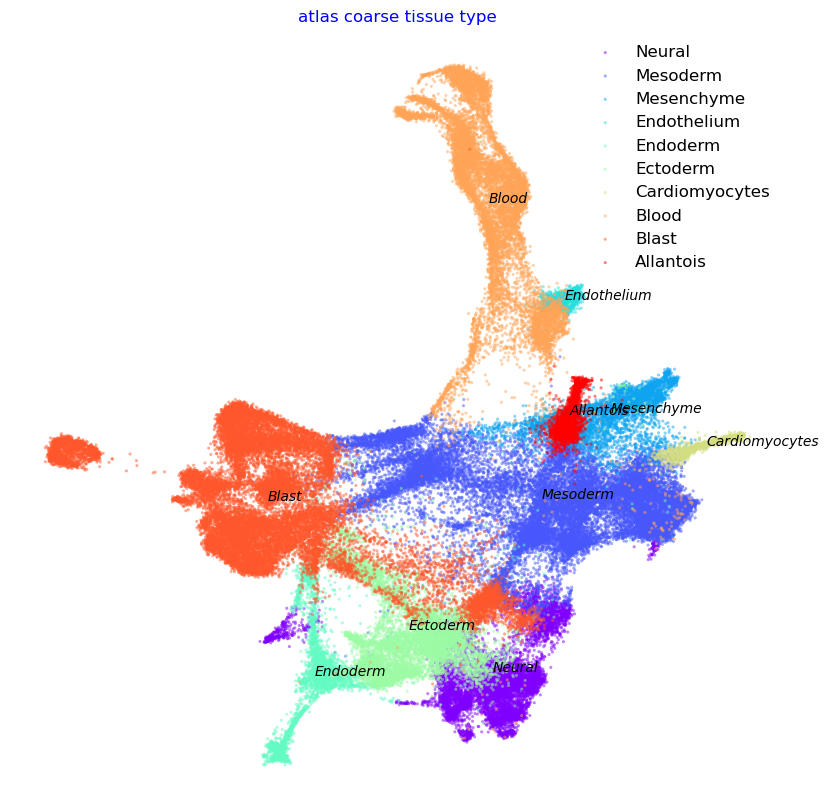

In [7]:
#plot the stored atlas embeddings by stage and cell type
print(f'{datetime.now()}\tStart plotting the saved via2 atlas embedding')
stage_label_numeric = [i for i in adata.obs['stage_num']]
cell_type_label = [i for i in     adata.obs['celltype']]

coarse_cell_type_label= [i for i in adata.obs['celltype_coarse']]
print('coarse cell_type', set(coarse_cell_type_label))
'''
#color by stage
f1, ax = via.plot_scatter(embedding=adata.obsm['X_Via2_atlas'] , labels=stage_label_numeric, cmap='plasma', s=5,
                          alpha=0.5, edgecolors='None',
                          title='atlas', text_labels=False)
f1.set_size_inches(10, 10)
'''

f2, ax = via.plot_scatter(embedding=adata.obsm['X_Via2_atlas'] , labels=coarse_cell_type_label, title='atlas coarse tissue type',
                          alpha=0.5, s=5)
f2.set_size_inches(10, 10)


### Set parameters for Via 2.0

***A quick note on how to (auto) set the root***
1. group level user-defined suggestion: e.g. `root = ['Epiblast']` The group level root assignment must correspond to a label that exists in the True-label parameter (must be passed inside a list). 
2. For autodetection based on rna-velocity root can be left as None.  Since we will be using the velocity matrices (see below), Via 2.0 will suggest a list of likely root cell states that the user can decide to choose between. It is helpful to examine the top 5 suggested roots and choose the one that seems most reasonable. Note in the output that Via 2.0's suggestions are almost all in the epibliast or Primitive streak state 
3. A single cell index can also be passed e.g. [25], means the 25th cell will be used as a root.

***Sequential Time-series labels***
1. Set `time_series=True` and pass the numerical time-series labels to Via using the parameter `time_series_labels = stage_label_numeric` which accepts a list of length n_cells. The trajectory will be adjusted to reinforce edges based on temporal adjacency and optionally weed out edges that are between cells more than `t_diff_step` apart.
2. The number of sequential edges `knn_sequential` can be used to emphasize adjacency in relation to edges between non-temporally adjacent edges.  

***Remark on Memory***
In most cases of well connected population, higher `memory` (10-100) helps the root-to-fate pathway avoid detours into unrelated populations. For rare populations, or those without many precursor populations, it can be useful to lower `memory` to between 1-10 in order to allow for more exploration.  

In [17]:
#set parameters for Via 2.0
memory=100 #this is a high memory value and will result in probabilistic pathways that avoid transitioning into unrelated cell populations 
cluster_graph_pruning = 0.15 #level of pruning done on the cluster graph. higher number means less pruning (values can range from 0-3 standard deviations)
edgepruning_clustering_resolution = 0.15  # regulates number of clusters. Higher values means fewer clusters (values can range from 0-3 standard deviations)
random_seed = 42 
knn = 30  # number of neighbors in the knn graph
knn_sequential = 15  # number of neighbors additionally created between sequentially adjacent time points 
n_pcs = 30 # number of principal components
velo_weight = 0.5  # 0.7 #weight given to velocity based direction compared to pseudotime based direction
t_diff_step = 2 #edges extending between nodes that are more than 2 time steps apart will be removed (i.e. equal to 3 or more time steps apart)
root = ['Epiblast_13'] #for reproducibility, we set the root here. the group level root assignment must correspond to a label that exists in the True-label parameter (must be passed inside a list). For autodetection based on rna-velocity it can be left as None. A single cell index can also be passed e.g. [256], means the 256th cell will be used as a root. Since we will be using the velocity matrices (see below), Via 2.0 will suggest a list of likely root cell states that the user can decide to choose between. It is helpful to examine the top 5 suggested roots and choose the one that seems most reasonable. Note in the output that Via 2.0's suggestions are almost all in the epibliast or Primitive streak state 
neighboring_terminal_states_threshold = 4
max_visual_outgoing_edges = 10#5 #used in differentiation flow chart plots
time_series = True

#get velocity and gene_matrices
subset = np.ones(adata.n_vars, bool)
subset &= np.array(adata.var["velocity_genes"].values, dtype=bool)
gene_matrix = np.asmatrix(adata.layers['Ms'][:, subset])  # None
velocity_matrix = adata.layers['velocity'][:, subset]  # None
cluster_celltype_label = [i for i in adata.obs['celltype_parc']]

#For reproducability we set the terminal states based on previous runs of Via 2.0 where the following cell fates were identified. This parameter can be left blank and a similar set of terminal states will be retrieved. This allows the user to control which suggested terminal states they are actually interested in or remove "duplicate" terminal states. The items in the list must correspond to items in the true_label list passed to Via 2.0. 
user_defined_terminal_group_auto = ['Erythroid3_48',
                                    'Erythroid3_12', 'Erythroid3_55',
                                    'Haematoendothelial progenitors_26',
                                    'Haematoendothelial progenitors_42', 'Haematoendothelial progenitors_61',
                                    'Paraxial mesoderm_15', 'Paraxial mesoderm_19', 'Paraxial mesoderm_56',
                                    'Paraxial mesoderm_32', 'Cardiomyocytes_39', 'Intermediate mesoderm_6',
                                    'Intermediate mesoderm_8', 'ExE mesoderm_46',
                                    'Allantois_63', 'Mesenchyme_66', 'Mesenchyme_71', 'NMP_57', 'NMP_59', 'NMP_36',
                                    'NMP_54', 'Neural crest_69', 'Forebrain/Midbrain/Hindbrain_25',
                                    'Forebrain/Midbrain/Hindbrain_24',
                                    'Forebrain/Midbrain/Hindbrain_44', 'Forebrain/Midbrain/Hindbrain_25',
                                    'Paraxial mesoderm_56',
                                    'Visceral endoderm_41', 'Visceral endoderm_70',
                                    'Surface ectoderm_49', 'Surface ectoderm_50', ]

### Initialize and Run the Via2.0 

**Optional: Predefined cluster labels and terminal cell fates**
By default, Via will compute its own clusters and terminal cell fates. However, in some cases it may be desirable to provide pre-computed cluster groupings or set terminal cell fates. This can also be helfpul for reproducibility.
In the example below, we set the clusters to those that we have computed on a prior run of Via. `labels = [list of numeric labels]` of length n_cells. 
We also set the cell fates to those precomputed by Via. `user_defined_terminal_group = [list of cell fates that corresponding to items in true_label]` This could also be provided as `user_defined_terminal_cell=[list of cell indices corresponding to cell fates]`

In [18]:
print(f'{datetime.now()}\tRun Via2.0')
parc_numeric_cluster_labels = [i for i in adata.obs['parc']]
parc_numeric_cluster_flat_array= np.asarray(parc_numeric_cluster_labels).flatten()
v0 = via.VIA(adata.obsm['X_pca'][:, 0:n_pcs], true_label= cluster_celltype_label, edgepruning_clustering_resolution=edgepruning_clustering_resolution,
             edgepruning_clustering_resolution_local=1, knn=knn, memory=memory, labels = parc_numeric_cluster_labels,
             cluster_graph_pruning=cluster_graph_pruning,
             neighboring_terminal_states_threshold=neighboring_terminal_states_threshold,
             too_big_factor=0.3, resolution_parameter=1,
             root_user=root, dataset='group', random_seed=random_seed,
             is_coarse=True, preserve_disconnected=False, pseudotime_threshold_TS=40, x_lazy=0.99,
             do_gaussian_kernel_edgeweights=False,
             alpha_teleport=0.99, edgebundle_pruning=cluster_graph_pruning, edgebundle_pruning_twice=False,
             velo_weight=velo_weight, velocity_matrix=velocity_matrix, gene_matrix=gene_matrix,
             time_series=time_series, time_series_labels=stage_label_numeric, knn_sequential=knn_sequential,
             knn_sequential_reverse=knn_sequential, t_diff_step=t_diff_step, RW2_mode=False,
            
             user_defined_terminal_group=user_defined_terminal_group_auto,
             max_visual_outgoing_edges=max_visual_outgoing_edges)
v0.run_VIA()
print(f'{datetime.now()}\tEnd Via2.0 computation')

2023-10-04 14:08:43.821979	Run Via2.0
2023-10-04 14:08:44.183992	Running VIA over input data of 89267 (samples) x 30 (features)
2023-10-04 14:08:44.184090	Knngraph has 30 neighbors
2023-10-04 14:09:06.782957	Using time series information to guide knn graph construction 
2023-10-04 14:09:06.800664	Time series ordered set [650, 675, 700, 725, 750, 775, 800, 825, 850]
2023-10-04 14:09:46.819205	Shape neighbors (89267, 30) and sequential neighbors (89267, 30)
2023-10-04 14:09:46.856059	Shape augmented neighbors (89267, 60)
2023-10-04 14:09:46.877363	Actual average allowable time difference between nodes is 50.0
2023-10-04 14:10:16.996644	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 49.4 % of edges. 
2023-10-04 14:10:17.115905	Number of connected components used for clustergraph  is 1
2023-10-04 14:10:35.514207	Using predfined labels provided by user (this must be provided as an array)
2023-10-04 14:10:35.514325	Making cluster graph. Global cluster grap

/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/pecanpy/graph.py:90: UserWarning: WARNING: Implicitly set node IDs to the canonical node ordering due to missing IDs field in the raw CSR npz file. This warning message can be suppressed by setting implicit_ids to True in the read_npz function call, or by setting the --implicit_ids flag in the CLI
  warnings.warn(


  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
do scaling of pt
2023-10-04 14:10:55.012227	Terminal cluster list based on user defined cells/groups: [('Erythroid3_48', 48), ('Erythroid3_12', 12), ('Erythroid3_55', 55), ('Haematoendothelial progenitors_26', 26), ('Haematoendothelial progenitors_42', 42), ('Haematoendothelial progenitors_61', 61), ('Paraxial mesoderm_15', 15), ('Paraxial mesoderm_19', 19), ('Paraxial mesoderm_56', 56), ('Paraxial mesoderm_32', 32), ('Cardiomyocytes_39', 39), ('Intermediate mesoderm_6', 6), ('Intermediate mesoderm_8', 8), ('ExE mesoderm_46', 46), ('Allantois_63', 63), ('Mesenchyme_66', 66), ('Mesenchyme_71', 71), ('NMP_57', 57), ('NMP_59', 59), ('NMP_36', 36), ('NMP_54', 54), ('Neural crest_69', 69), ('Forebrain/Midbrain/Hindbrain_25', 25), ('Forebrain/Midbrain/Hindbrain_24', 24), ('Forebrain/Midbrain/Hindbrain_44', 44), ('Visceral endoderm_41', 41), ('Visceral endoderm_70', 70), ('Surface ectoderm_49', 49), ('Surface ectoderm_50', 50)]
2023-10-04 1

/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/pecanpy/graph.py:90: UserWarning: WARNING: Implicitly set node IDs to the canonical node ordering due to missing IDs field in the raw CSR npz file. This warning message can be suppressed by setting implicit_ids to True in the read_npz function call, or by setting the --implicit_ids flag in the CLI
  warnings.warn(


  0%|          | 0/1000 [00:00<?, ?it/s]

2023-10-04 14:10:59.943211	 Cluster or terminal cell fate 48 is reached 45.0 times
2023-10-04 14:11:00.206447	 Cluster or terminal cell fate 12 is reached 41.0 times
2023-10-04 14:11:00.488101	 Cluster or terminal cell fate 55 is reached 22.0 times
2023-10-04 14:11:00.762313	 Cluster or terminal cell fate 26 is reached 35.0 times
2023-10-04 14:11:01.037768	 Cluster or terminal cell fate 42 is reached 40.0 times
2023-10-04 14:11:01.303138	 Cluster or terminal cell fate 61 is reached 36.0 times
2023-10-04 14:11:01.582438	 Cluster or terminal cell fate 15 is reached 29.0 times
2023-10-04 14:11:01.853243	 Cluster or terminal cell fate 19 is reached 22.0 times
2023-10-04 14:11:02.147883	 Cluster or terminal cell fate 56 is reached 2.0 times
2023-10-04 14:11:02.345118	 Cluster or terminal cell fate 32 is reached 28.0 times
2023-10-04 14:11:02.598388	 Cluster or terminal cell fate 39 is reached 34.0 times
2023-10-04 14:11:02.845540	 Cluster or terminal cell fate 6 is reached 79.0 times
2023-1

/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


2023-10-04 14:11:15.208715	Time elapsed 132.3 seconds
2023-10-04 14:11:15.209000	End Via2.0 computation


### Plot Via2.0 cluster graph

Examples showing how to control the colormaps, labeling and choice of attribute to plot on the viagraph

2023-10-04 14:18:30.361275	Plot Via2.0 cluster graph


/home/user/PycharmProjects/Via2_May2023_py310/plotting_via.py:3092: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sct = ax.scatter(node_pos[:, 0], node_pos[:, 1],
/home/user/PycharmProjects/Via2_May2023_py310/plotting_via.py:3092: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sct = ax.scatter(node_pos[:, 0], node_pos[:, 1],
/home/user/PycharmProjects/Via2_May2023_py310/plotting_via.py:3092: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sct = ax.scatter(node_pos[:, 0], node_pos[:, 1],


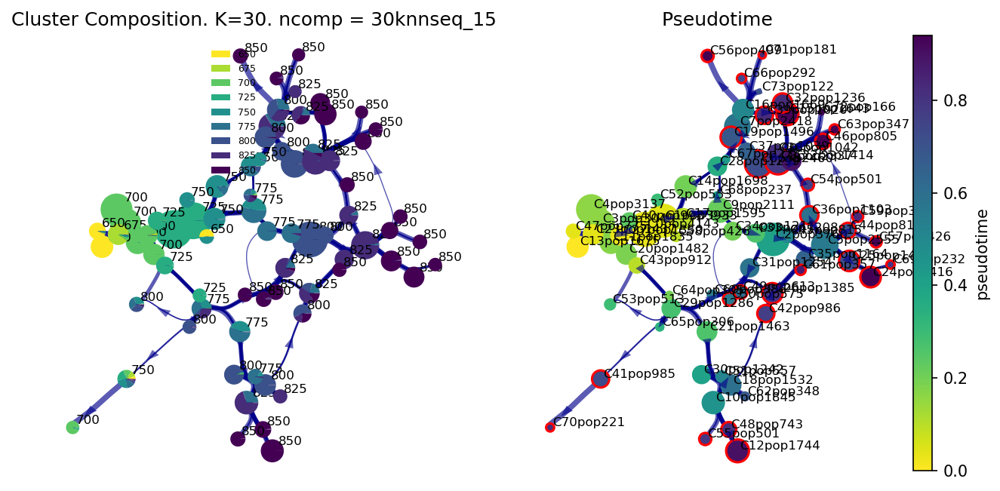

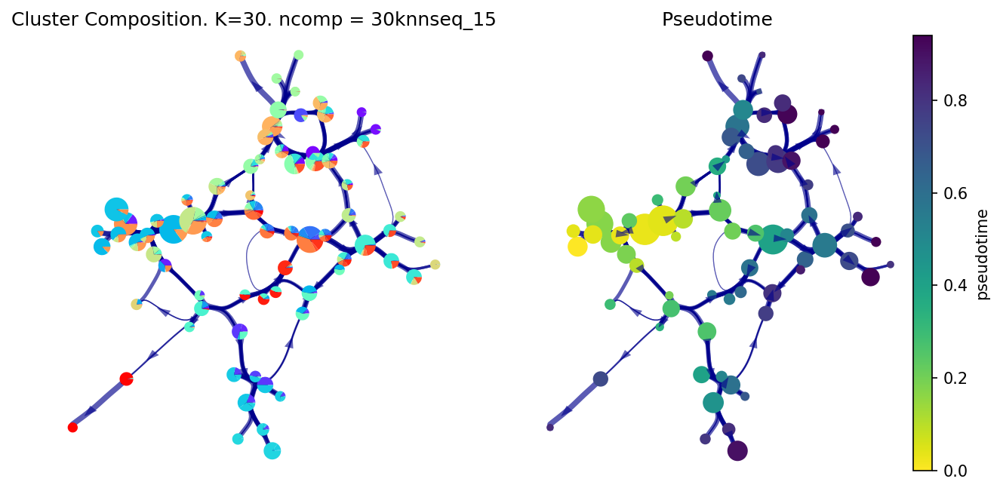

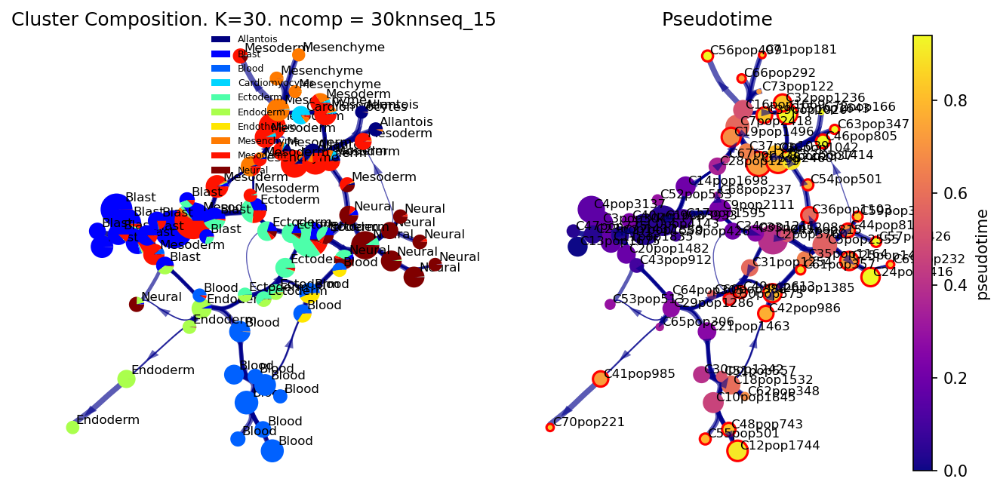

In [20]:
print(f'{datetime.now()}\tPlot Via2.0 cluster graph')

f, ax, ax1=via.plot_piechart_viagraph(via_object=v0, cmap_piechart='viridis_r', cmap='viridis_r',                        reference_labels=stage_label_numeric, headwidth_arrow=0.4,
                        highlight_terminal_clusters=True)
f.set_size_inches(10, 5)
f, ax, ax1=via.plot_piechart_viagraph(via_object=v0, headwidth_arrow=0.4, show_legend=False, ax_text=False, pie_size_scale=0.6,
                        highlight_terminal_clusters=False, size_node_notpiechart=0.8)
f.set_size_inches(10, 5)
f, ax, ax1= via.plot_piechart_viagraph(via_object=v0, cmap_piechart='jet', cmap='plasma',
                        reference_labels=coarse_cell_type_label, headwidth_arrow=0.4,
                        highlight_terminal_clusters=True,size_node_notpiechart=0.8)
f.set_size_inches(10, 5)


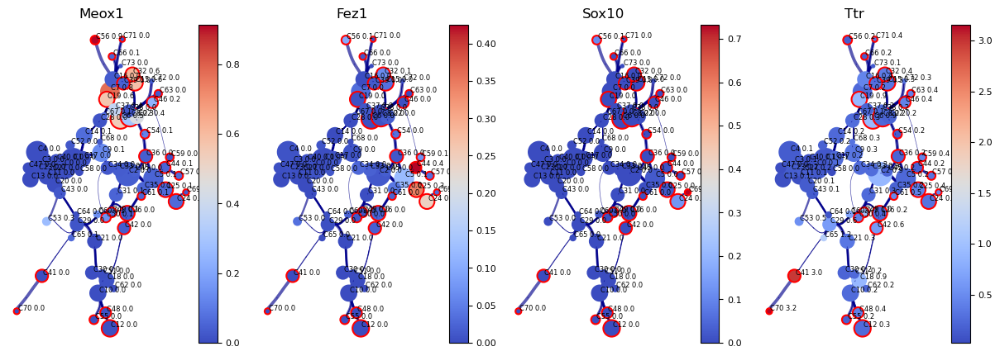

In [21]:
genes=['Meox1','Fez1','Sox10','Ttr']
df_genes_sc = pd.DataFrame(adata[:, genes].X.todense(), columns=genes)
fig, axs=via.plot_viagraph(via_object=v0, df_genes=df_genes_sc, gene_list=genes)#, label_text=False)
fig.set_size_inches(15,5)

### Compute Atlas single-cell embedding
We transfer the properties of the trajectory infused viagraph and the single-cell temporally adjusted graph to generate an embedding that visually conveys the structure of the trajectory and can be used as the basis of the Atlas View (described farther down)

1. For simplicity, or just to get a feel for the process, use the RW2_features stored in the adata object to be able to go straight to **STEP 3** where `X_input = adata.obsm['RW2_features'][:, 0:n_pcs]` or simply use PCs by setting `X_input = adata.obsm['X_pca'][:, 0:n_pcs]`
2. On the very first run we need to compute the graph-network representation features (n_dim = 64 or 128 is enough). We will use these instead of Principal Components as they can preserve global network structure a bit better. To compute the graph-network features run the code called **STEP 1**. This automatically saves a csv.file of n_samples x n_dim in the folder indicated by `working_directory` and also returns a ndarray rw_features_input
2. If you have already run **STEP 1** in a prior run, then you can Skip STEP1 and instead run the code in **STEP 2** to load the feature matrix from the csv file saved to the location from **STEP 1**
3. Compute the atlas embedding **STEP 3**
4. Plot based on cell type or other attributes

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


2023-09-20 10:57:23.986672	Start Atlas embedding computation
2023-09-20 10:57:23.987906	Plot Atlas Embedding


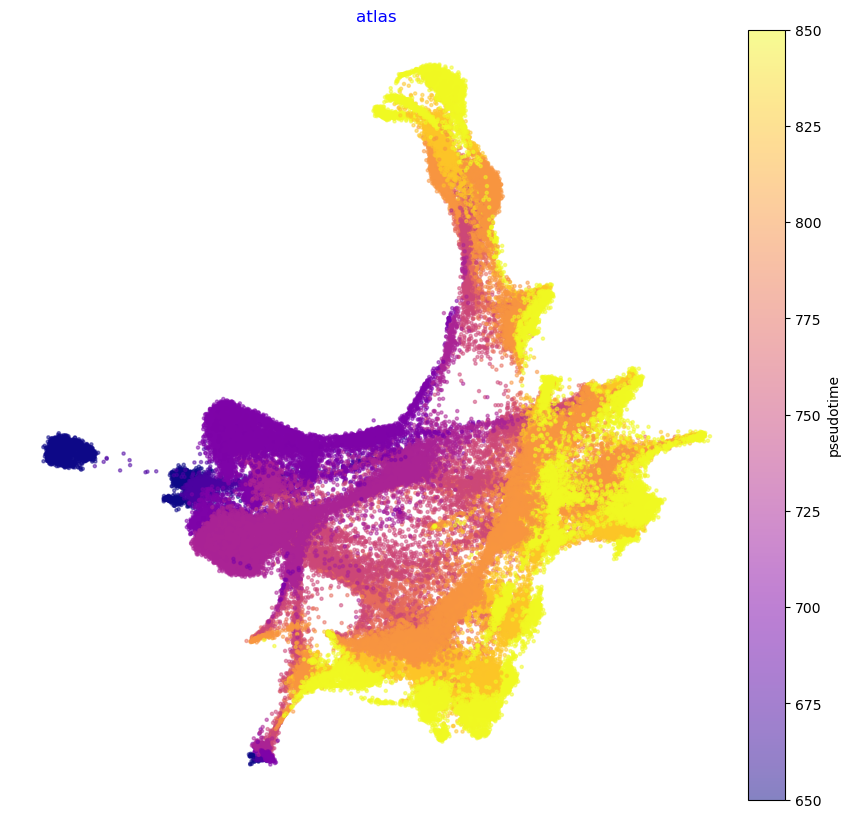

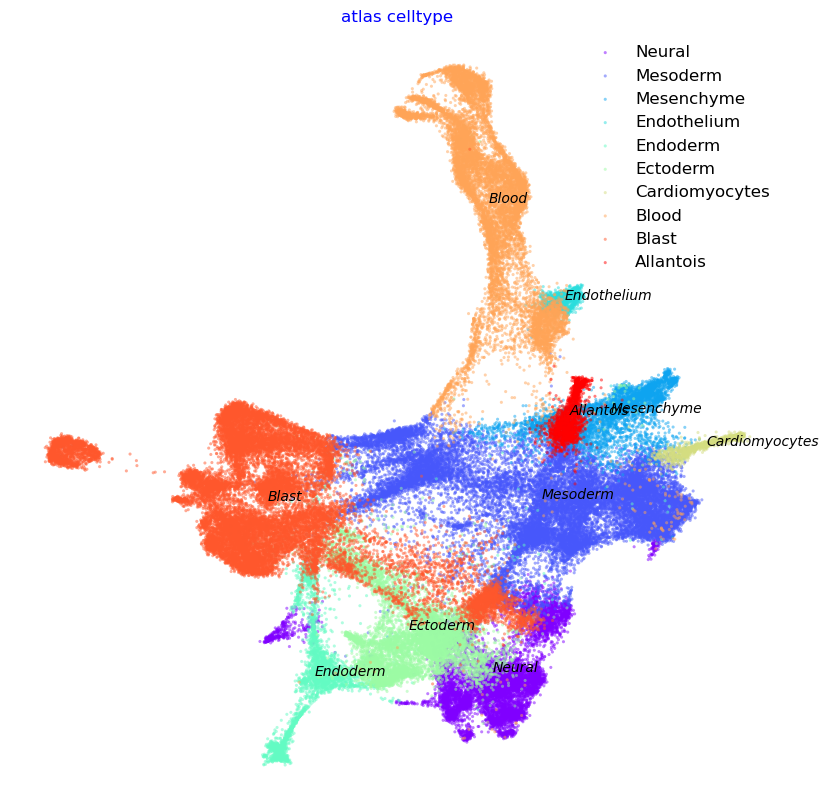

In [9]:
compute_features=False
if compute_features:
    #STEP 1
    feature_rep_fpath, rw_features_input = via.rw2_feature_representation(via_object=v0,   working_directory='/home/user/Trajectory/Datasets/Pijuan_Gastrulation/RW2/Sept/',  n_dim=64)

load_rw2_features=False
if load_rw2_features:
    #STEP 2
    rw_features_input = pd.read_csv('/home/user/Trajectory/Datasets/Pijuan_Gastrulation/RW2/Sept/pc30_knn30rw2_428_ndim64_qin1_pret0.5.csv')  # pc30_knn30kseq15krev15RW2_emd_122.csv')
    rw_features_input= rw_features_input.drop(['Unnamed: 0'], axis=1).values
    X_input =rw_features_input[:, 0:n_pcs] #use features computed previously and saved
else: 
    if compute_features:  X_input = rw_features_input[:, 0:n_pcs] #use those computed in STEP 1
    else: X_input = adata.obsm['RW2_features'][:, 0:n_pcs] #use precomputed features saved in anndata
print(f'{datetime.now()}\tStart Atlas embedding computation')
compute_atlas_embedding = True
if compute_atlas_embedding:
    #STEP 3
    atlas_embedding = via.via_atlas_emb(via_object=v0, X_input=X_input, init_pos='via', min_dist=0.2)
else: atlas_embedding = embedding=adata.obsm['X_Via2_atlas']

print(f'{datetime.now()}\tPlot Atlas Embedding')
f1, ax = via.plot_scatter(embedding=atlas_embedding, labels=stage_label_numeric, cmap='plasma', s=5,
                          alpha=0.5, edgecolors='None',
                          title='atlas', text_labels=False)
f1.set_size_inches(10, 10)

f2, ax = via.plot_scatter(embedding=atlas_embedding, labels=coarse_cell_type_label, title='atlas celltype',
                          alpha=0.5, s=5)
f2.set_size_inches(10, 10)
#plt.show()

### The Atlas View

Now we look at how to construct the atlas view which combines the single-cell spatial layout with a high-resoulution view of the edge connectivity (potential pathways). 
1. If you want more control then consider running the edge construction step shown in ***STEP 1***
2. You can skip ***STEP 1*** and directly call plot_atlas_view() in ***STEP 2*** and set a parameter n_milestones to the desired granularity. This parameter is o/w autoset based on data.


In [ ]:
print(f'{datetime.now()}\tCreate edgebundle')
# STEP 1
decay = 0.6  # increasing decay increasing merging of edges
i_bw = 0.02  # increasing bw increases merging of edges
global_visual_pruning = 0.6  # increasing this retains more edges 
v0.embedding = atlas_embedding #pass the embedding we computed into the Via object

import random
pseudorand = random.randint(0, 1000)
n_milestones = 150  
hammerbundle_dict = via.make_edgebundle_milestone(via_object=v0, n_milestones=n_milestones, decay=decay,
                                                  initial_bandwidth=i_bw, global_visual_pruning=global_visual_pruning,
                                                  sc_labels_numeric=stage_label_numeric)
v0.hammerbundle_milestone_dict = hammerbundle_dict  # make the hmbd and assign it to the via_object. this can then be used for all plots without having to recompute it

2023-09-21 08:02:37.438382	Plot edgebundle
inside add sc embedding second if


"\nfig, ax = via.plot_edge_bundle(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True, sc_labels_expression=stage_label_numeric,sc_scatter_alpha=0.15,scatter_size_sc_embedding=10,\n                     linewidth_bundle=3, alpha_bundle_factor=1.5, headwidth_bundle=0.2,\n                     cmap='plasma_r', facecolor='white', size_scatter=1, alpha_scatter=0.1,  global_visual_pruning=global_visual_pruning,\n                     scale_scatter_size_pop=True, fontsize_labels=16,\n                     extra_title_text='EStage decay:' + str(decay) + ' bw:' + str(i_bw)+'globalVisPruning:'+str(global_visual_pruning),\n                     text_labels=False, sc_labels=cell_type_label, use_sc_labels_sequential_for_direction=True)\nfig.set_size_inches(35, 25)\nplt.show()\n"

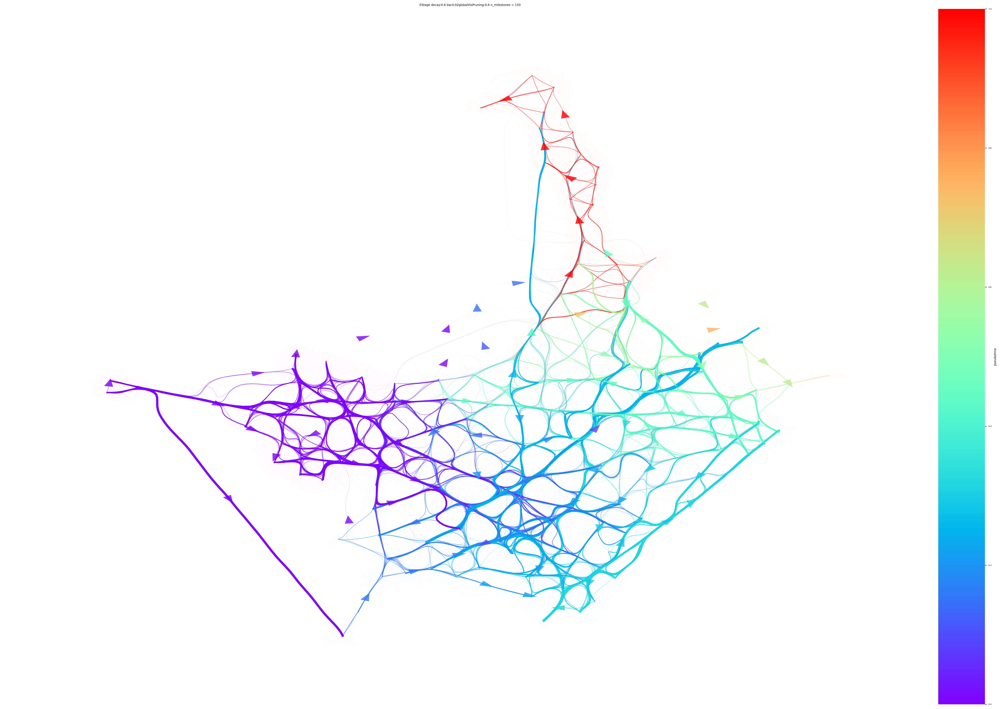

In [35]:
print(f'{datetime.now()}\tPlot edgebundle')
# STEP 2
dict_coarse = {'Neural': 2.5, 'Mesoderm': 3.5, 'neural_crest': 4.5, 'Mesenchyme': 5,
                   'Endothelium': 7, 'Endoderm': 1.25,
                   'Ectoderm': 2, 'Cardiomyocytes': 6, 'Blood': 8, 'Blast': 0,'Allantois':4}
fig, ax = via.plot_atlas_view(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True,
                               sc_labels_expression=[dict_coarse[coarse_cell_type_label[i]] for i in
                                                     range(len(v0.labels))], sc_scatter_alpha=0.01,
                               scatter_size_sc_embedding=5,
                               linewidth_bundle=4, alpha_bundle_factor=1.5, headwidth_bundle=0.2,
                               cmap='rainbow', facecolor='white', size_scatter=1, alpha_scatter=0.1,
                               global_visual_pruning=global_visual_pruning,
                               scale_scatter_size_pop=True, fontsize_labels=16,
                               extra_title_text='EStage decay:' + str(decay) + ' bw:' + str(
                                   i_bw) + 'globalVisPruning:' + str(global_visual_pruning),
                               text_labels=False, sc_labels=cell_type_label, use_sc_labels_sequential_for_direction=True)
fig.set_size_inches(35, 25)

'''
fig, ax = via.plot_atlas_view(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True, sc_labels_expression=stage_label_numeric,sc_scatter_alpha=0.15,scatter_size_sc_embedding=10,
                     linewidth_bundle=3, alpha_bundle_factor=1.5, headwidth_bundle=0.2,
                     cmap='plasma_r', facecolor='white', size_scatter=1, alpha_scatter=0.1,  global_visual_pruning=global_visual_pruning,
                     scale_scatter_size_pop=True, fontsize_labels=16,
                     extra_title_text='EStage decay:' + str(decay) + ' bw:' + str(i_bw)+'globalVisPruning:'+str(global_visual_pruning),
                     text_labels=False, sc_labels=cell_type_label, use_sc_labels_sequential_for_direction=True)
fig.set_size_inches(35, 25)
plt.show()
'''

### Plot single-cell lineage probabilities
***Memory***
- The lineage probability pathways below are computed based on a memory parameter value of 100 (set when we initialized Via), this is a high degree of memory. Sometimes a very high memory can prevent rarer population from being reached, depending on the connectivity of the network. You can always try lowering the value to e.g. 10 or 50. 
- If you run Via at *memory=1* (the no memory case), and then plot the lineage probability pathways and gene trends, you will notice that many of the pathways are diffuse (migrating into unrelated cell populations) and the gene trends can overlap and not be very discriminative. 

2023-09-21 07:44:18.819316	Plot single-cell lineage probabilities
location of 15 is at [6] and 6
location of 69 is at [21] and 21
location of 24 is at [23] and 23
location of 71 is at [16] and 16
location of 50 is at [28] and 28
location of 36 is at [19] and 19


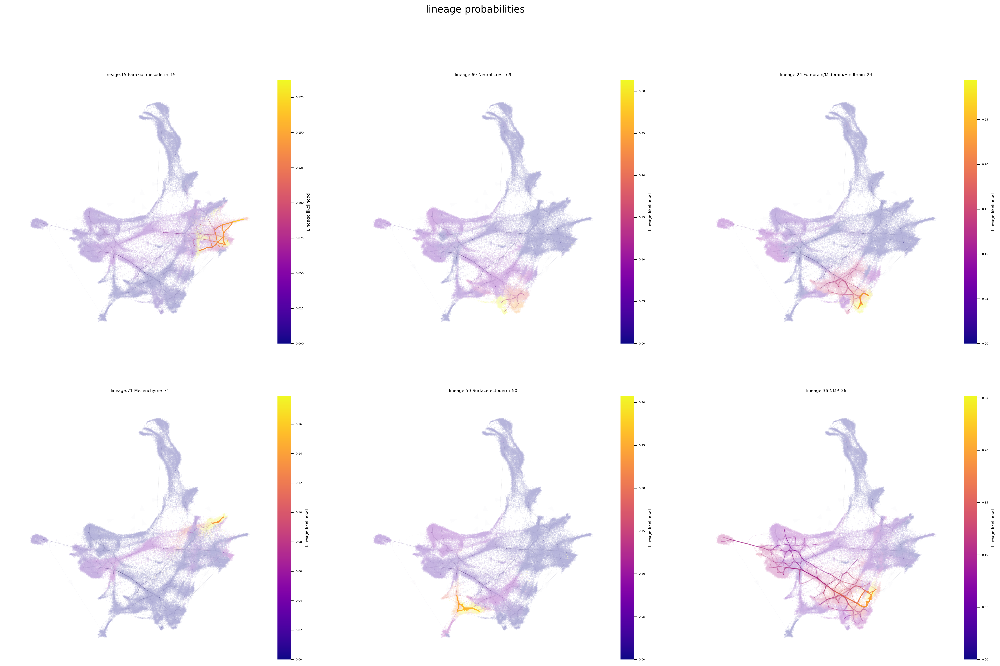

In [30]:
print(f'{datetime.now()}\tPlot single-cell lineage probabilities')

select_terminal_clusters =  [15, 69, 24, 71, 50, 36]
fig, ax = via.plot_atlas_view(via_object=v0, lineage_pathway=select_terminal_clusters, linewidth_bundle=4, alpha_bundle_factor=5, headwidth_bundle=0.4,
                                           size_scatter=0.05, alpha_scatter=0.3, sc_scatter_size=3, sc_scatter_alpha=0.3,
                                           use_sc_labels_sequential_for_direction=True)
fig.suptitle('lineage probabilities', fontsize=14)
fig.set_size_inches(25, 15)


### Plot gene trends 

***Memory***
- The gene trends use the lineage probabilities computed at a memory parameter value of 100, this is a high degree of memory which means the gene trends have higher specificity to their respective gene markers.
- If you run Via at *memory=1* (the no memory case), and then plot the lineage probability pathways and gene trends, you will notice that many of the pathways are diffuse (migrating into unrelated cell populations) and the gene trends can overlap and not be very discriminative. 

100 q_memory


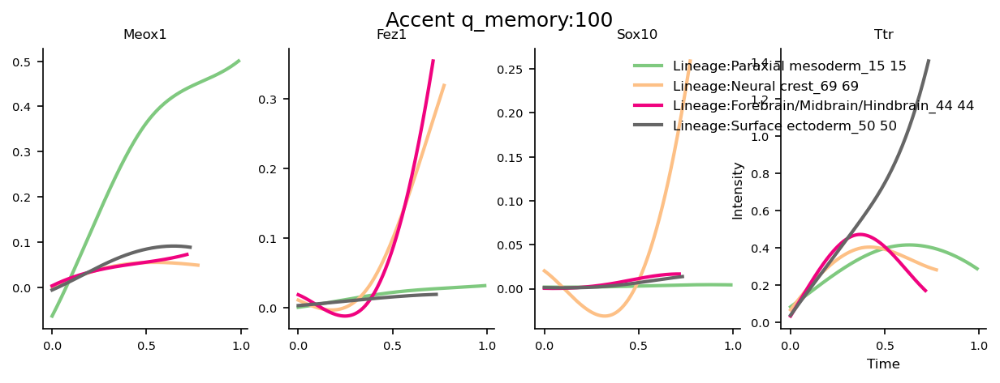

In [24]:
genes=['Meox1','Fez1','Sox10','Ttr']
df_genes_sc = pd.DataFrame(adata[:, genes].X.todense(), columns=genes)

select_terminal_clusters = [15, 69, 44, 50]
spline_order = 3
n_splines = 5
fig, axs= via.get_gene_expression(via_object=v0, gene_exp=df_genes_sc, marker_genes=genes,
                        marker_lineages=select_terminal_clusters,  # 56,50,25
                        n_splines=n_splines, spline_order=spline_order, cmap='Accent')
print(memory,'q_memory')
plt.suptitle('Accent q_memory:' + str(memory))
fig.set_size_inches(10, 3)

### Plot stream plot using hybrid pseudotime-RNAvelocity based directionality

Using a combination of pseudotime and rna-velocity ensures biologically meaningful directionality

2023-09-20 14:53:34.466470	Plot stream plot


/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/home/user/PycharmProjects/Via2_May2023_py310/core_working_rw2.py:1325: RuntimeWarning: divide by zero encountered in divide
  T = T.multiply(csr_matrix(1.0 / np.abs(T).sum(1)))  # rows sum to one
/home/user/PycharmProjects/Via2_May2023_py310/core_working_rw2.py:1349: RuntimeWarning: invalid value encountered in divide
  dX /= l2_norm(dX)[:, None]
/home/user/PycharmProjects/Via2_May2023_py310/core_working_rw2.py:1356: RuntimeWarning: Mean of empty slice.
  V_emb[i] = probs.dot(dX) - probs.mean() * dX.sum(0)
/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


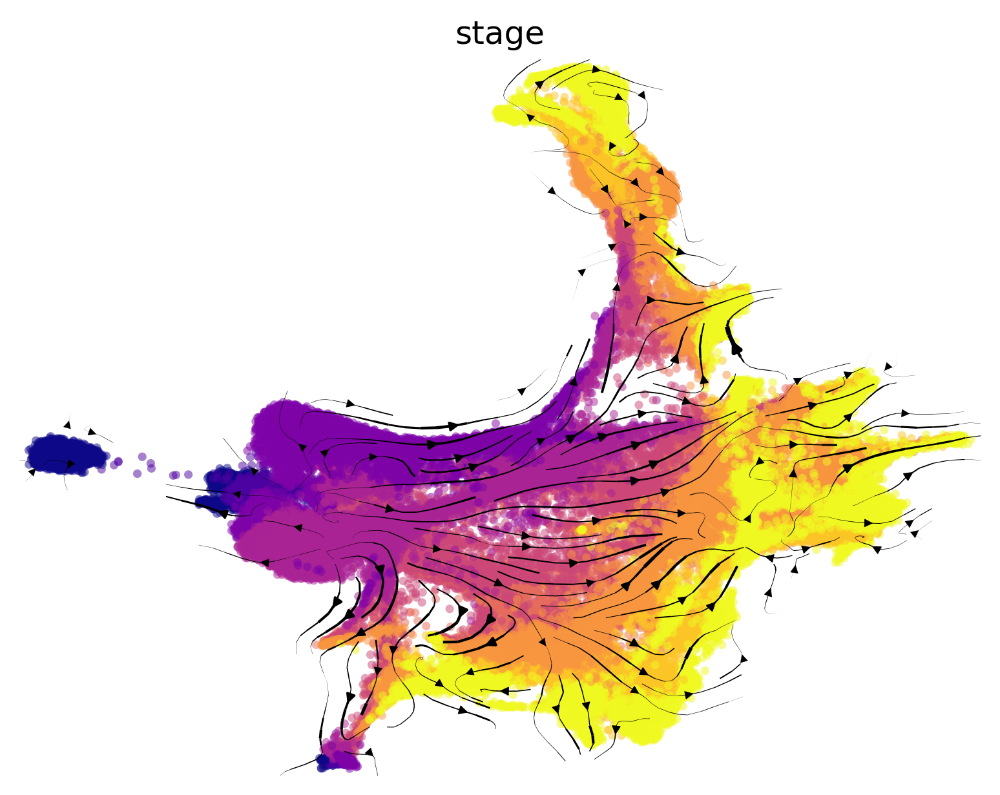

In [25]:
print(f'{datetime.now()}\tPlot stream plot')
via.via_streamplot(v0, embedding=atlas_embedding, scatter_size=10, scatter_alpha=0.5, marker_edgewidth=0.01, density_stream=2,
                   density_grid=1, smooth_transition=2, smooth_grid=0.5,  title='stage', labels=stage_label_numeric, cmap='plasma')
plt.show()